# Consensus Whole Mouse Brain #2: 10X gene expression

In the [previous notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/consensus_mouse_clustering_analysis_and_annotation.html), we explored the integrated taxonomy and combined it with cell level and other metadata. In this notebook, we load and explore gene expression data, loading the expression of specific genes. We plot these expressions in the heatmaps, comparing the expression across the taxonomy and anatomical region, as well as show the gene expression in the UMAP.

In [1]:
%matplotlib inline

import pandas as pd
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
from typing import List, Optional, Tuple

from abc_atlas_access.abc_atlas_cache.abc_project_cache import AbcProjectCache
from abc_atlas_access.abc_atlas_cache.anndata_utils import get_gene_data

We will interact with the data using the **AbcProjectCache**. This cache object tracks which data has been downloaded and serves the path to the requested data on disk. For metadata, the cache can also directly serve up a Pandas DataFrame. See the [``getting_started``](https://alleninstitute.github.io/abc_atlas_access/notebooks/getting_started.html) notebook for more details on using the cache including installing it if it has not already been. 

**Change the download_base variable to where you would like to download the data to your system.**

In [2]:
download_base = Path('../../data/abc_atlas')
abc_cache = AbcProjectCache.from_cache_dir(
    download_base
)

abc_cache.current_manifest

'releases/20260131/manifest.json'

Below we create the expanded cell metadata as was done previously in the [cluster annotation tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/consensus_mouse_clustering_analysis_and_annotation.html).

In [3]:
cell_to_cluster_membership = abc_cache.get_metadata_dataframe(
    'Consensus-WMB-integrated-taxonomy', 'cell_to_cluster_membership'
).set_index('cell_label')
cluster = abc_cache.get_metadata_dataframe(
    'Consensus-WMB-integrated-taxonomy', 'cluster'
).set_index('label')
cluster_annotation_term = abc_cache.get_metadata_dataframe(
    'Consensus-WMB-integrated-taxonomy', 'cluster_annotation_term'
).set_index('label')

cluster_annotation_term_set = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-integrated-taxonomy',
    file_name='cluster_annotation_term_set'
).set_index('label')

cluster_to_cluster_annotation_membership = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-integrated-taxonomy',
    file_name='cluster_to_cluster_annotation_membership'
).set_index('cluster_annotation_term_label')

macosko_cell_metadata = abc_cache.get_metadata_dataframe('Consensus-WMB-Macosko-10X', 'cell_metadata').set_index('cell_label')
aibs_cell_metadata = abc_cache.get_metadata_dataframe('Consensus-WMB-AIBS-10X', 'cell_metadata').set_index('cell_label')

membership_with_cluster_info = cluster_to_cluster_annotation_membership.join(
    cluster.reset_index().set_index('cluster_alias')[['number_of_cells']],
    on='cluster_alias'
)

membership_with_cluster_info = membership_with_cluster_info.join(cluster_annotation_term, rsuffix='_anno_term').reset_index()

membership_groupby = membership_with_cluster_info.groupby(
    ['cluster_alias', 'cluster_annotation_term_set_name']
)

cluster_details = membership_groupby['cluster_annotation_term_name'].first().unstack()
cluster_order = membership_groupby['term_order'].first().unstack()
cluster_order.sort_values(['neighborhood', 'class', 'subclass', 'supertype', 'cluster'], inplace=True)

cluster_colors = membership_groupby['color_hex_triplet'].first().unstack()
cluster_colors = cluster_colors[cluster_annotation_term_set['name']]
cluster_colors.sort_values(
    ['neighborhood', 'class', 'subclass', 'supertype', 'cluster'],
    inplace=True
)

aibs_cell_extended = aibs_cell_metadata.join(cell_to_cluster_membership, how='inner')
aibs_cell_extended = aibs_cell_extended.join(cluster_details, on='cluster_alias')
aibs_cell_extended = aibs_cell_extended.join(cluster_colors, on='cluster_alias', rsuffix='_color')
aibs_cell_extended = aibs_cell_extended.join(cluster_order, on='cluster_alias', rsuffix='_order')

aibs_library = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-AIBS-10X',
    file_name='library'
).set_index('library_label')
aibs_donor = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-AIBS-10X',
    file_name='donor'
).set_index('donor_label')
aibs_cell_extended = aibs_cell_extended.join(aibs_library, on='library_label')
aibs_cell_extended = aibs_cell_extended.join(aibs_donor, on='donor_label')

macosko_cell_extended = macosko_cell_metadata.join(cell_to_cluster_membership, how='inner')
macosko_cell_extended = macosko_cell_extended.join(cluster_details, on='cluster_alias')
macosko_cell_extended = macosko_cell_extended.join(cluster_colors, on='cluster_alias', rsuffix='_color')
macosko_cell_extended = macosko_cell_extended.join(cluster_order, on='cluster_alias', rsuffix='_order')

macosko_library = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-Macosko-10X',
    file_name='library'
).set_index('library_label')
macosko_donor = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-Macosko-10X',
    file_name='donor'
).set_index('donor_label')
macosko_cell_extended = macosko_cell_extended.join(macosko_library, on='library_label')
macosko_cell_extended = macosko_cell_extended.join(macosko_donor, on='donor_label')

value_sets = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-AIBS-10X',
    file_name='value_sets'
).set_index('label')

def extract_value_set(cell_metadata_df: pd.DataFrame, input_value_set: pd.DataFrame, input_value_set_label: str):
    """Add color and order columns to the cell metadata dataframe based on the input
    value set.

    Columns are added as {input_value_set_label}_color and {input_value_set_label}_order.

    Parameters
    ----------
    cell_metadata_df : pd.DataFrame
        DataFrame containing cell metadata.
    input_value_set : pd.DataFrame
        DataFrame containing the value set information.
    input_value_set_label : str
        The the column name to extract color and order information for. will be added to the cell metadata.
    """
    cell_metadata_df[f'{input_value_set_label}_color'] = input_value_set[
        input_value_set['field'] == input_value_set_label
    ].loc[cell_metadata_df[input_value_set_label]]['color_hex_triplet'].values
    cell_metadata_df[f'{input_value_set_label}_order'] = input_value_set[
        input_value_set['field'] == input_value_set_label
    ].loc[cell_metadata_df[input_value_set_label]]['order'].values

# Add region of interest color and order
extract_value_set(macosko_cell_extended, value_sets, 'origin_dataset')
# Add species common name color and order
extract_value_set(macosko_cell_extended, value_sets, 'donor_sex')
# Add species scientific name color and order
extract_value_set(macosko_cell_extended, value_sets, 'anatomical_division_label')

# Add region of interest color and order
extract_value_set(aibs_cell_extended, value_sets, 'origin_dataset')
# Add species common name color and order
extract_value_set(aibs_cell_extended, value_sets, 'donor_sex')
# Add species scientific name color and order
extract_value_set(aibs_cell_extended, value_sets, 'anatomical_division_label')

cell_to_cluster_membership.csv: 100%|██████████| 310M/310M [00:09<00:00, 31.5MMB/s]    
cluster.csv: 100%|██████████| 203k/203k [00:00<00:00, 1.19MMB/s] 
cluster_annotation_term.csv: 100%|██████████| 1.38M/1.38M [00:00<00:00, 9.28MMB/s]
cluster_annotation_term_set.csv: 100%|██████████| 388/388 [00:00<00:00, 7.09kMB/s]
cluster_to_cluster_annotation_membership.csv: 100%|██████████| 3.07M/3.07M [00:00<00:00, 5.83MMB/s]
cell_metadata.csv: 100%|██████████| 506M/506M [00:16<00:00, 31.1MMB/s]    
cell_metadata.csv: 100%|██████████| 375M/375M [00:11<00:00, 33.9MMB/s]    
library.csv: 100%|██████████| 59.0k/59.0k [00:00<00:00, 457kMB/s]
donor.csv: 100%|██████████| 16.6k/16.6k [00:00<00:00, 244kMB/s]
library.csv: 100%|██████████| 27.7k/27.7k [00:00<00:00, 233kMB/s]
donor.csv: 100%|██████████| 1.29k/1.29k [00:00<00:00, 17.0kMB/s]
value_sets.csv: 100%|██████████| 2.47k/2.47k [00:00<00:00, 12.0kMB/s]


### Single cell and nuclei transcriptomes

Below we use the convenience function `get_gene_data` to download and extract specific genes from the gene expression h5ad files. This function can be used to pull expression for the full set of cells or any subset from the set of cell metadata.

We first load the gene data for the WMB-AIBS portion of the consensus dataset. Note that this reuses the previous [WMB-10X](https://alleninstitute.github.io/abc_atlas_access/descriptions/WMB-10X.html) release's genes and expression matrices.

In [4]:
aibs_gene = abc_cache.get_metadata_dataframe(
    directory='WMB-10X',
    file_name='gene'
).set_index('gene_identifier')
print("Number of aligned genes = ", len(aibs_gene))
aibs_gene.head(5)

gene.csv: 100%|██████████| 2.30M/2.30M [00:00<00:00, 8.20MMB/s]


Number of aligned genes =  32285


,gene_symbol,name,mapped_ncbi_identifier,comment
gene_identifier,,,,
ENSMUSG00000051951,Xkr4,X-linked Kx blood group related 4,NCBIGene:497097,NaN
ENSMUSG00000089699,Gm1992,predicted gene 1992,NaN,NaN
ENSMUSG00000102331,Gm19938,"predicted gene, 19938",NaN,NaN
ENSMUSG00000102343,Gm37381,"predicted gene, 37381",NaN,NaN
ENSMUSG00000025900,Rp1,retinitis pigmentosa 1 (human),NCBIGene:19888,NaN


Next we load the same metadata for the Macosko data. Note that the two samples have slightly different sets of genes, however, they have a large overlap. 

In [5]:
macosko_gene = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-Macosko-10X',
    file_name='gene'
).set_index('gene_identifier')
print("Number of aligned genes = ", len(macosko_gene))
macosko_gene.head(5)

gene.csv: 100%|██████████| 546k/546k [00:00<00:00, 2.83MMB/s] 


Number of aligned genes =  21205


,gene_symbol
gene_identifier,
ENSMUSG00000072572,Slc39a2
ENSMUSG00000063179,Pstk
ENSMUSG00000041220,Elovl6
ENSMUSG00000042246,Tmc7
ENSMUSG00000075072,Olfr48


Below we list the genes we will use in this notebook and the example method used to load the expression for these specific genes from the h5ad file. Note that we provide a set of example gene expressions as a csv file for brevity in this tutorial. To process and extract the gene expressions for yourself, uncomment the code block below. Note that there are two different calls one for the WMB-AIBS data and one for the WMB-Macosko data. These two calls need to be separated but the results can be combined afterward. Warning that this is a large amount of data and may take a significant fraction of time to download. This download action will only need to be performed once, however.

For more details on how to extract specific genes from the data see our [accessing gene expression data tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/general_accessing_10x_snRNASeq_tutorial.html)

In [6]:
gene_names = ['Slc17a7', 'Slc17a6', 'Slc17a8', 'Slc32a1', 'Slc6a5', 'Slc18a3', 'Slc6a3', 'Slc6a4', 'Slc6a2']
"""
aibs_gene_data = get_gene_data(
    abc_atlas_cache=abc_cache,
    all_cells=aibs_cell_metadata,
    all_genes=aibs_gene,
    selected_genes=gene_names
)
"""

'\naibs_gene_data = get_gene_data(\n    abc_atlas_cache=abc_cache,\n    all_cells=aibs_cell_metadata,\n    all_genes=aibs_gene,\n    selected_genes=gene_names\n)\n'

In [7]:
"""
macosko_gene_data = get_gene_data(
    abc_atlas_cache=abc_cache,
    all_cells=macosko_cell_metadata,
    all_genes=macosko_gene,
    selected_genes=gene_names
)
"""

'\nmacosko_gene_data = get_gene_data(\n    abc_atlas_cache=abc_cache,\n    all_cells=macosko_cell_metadata,\n    all_genes=macosko_gene,\n    selected_genes=gene_names\n)\n'

Instead of processing the gene expressions, we load pre-processed files containing the expression for the genes listed above.

In [8]:
macosko_gene_data = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-Macosko-10X',
    file_name='example_gene_expression'
).set_index('cell_label')
aibs_gene_data = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-AIBS-10X',
    file_name='example_gene_expression'
).set_index('cell_label')

example_gene_expression.csv: 100%|██████████| 330M/330M [00:09<00:00, 34.0MMB/s]    
example_gene_expression.csv: 100%|██████████| 291M/291M [00:08<00:00, 33.9MMB/s]    


We load and merge the expression into each of our cell metadata.

In [9]:
aibs_cell_extended = aibs_cell_extended.join(aibs_gene_data)
macosko_cell_extended = macosko_cell_extended.join(macosko_gene_data)

## Example use cases

In this section, we show a use case plotting a set of genes that map onto a cononical set of neurotransmitters. These are the same set of genes used in the [WMB-AIBS tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/10x_snRNASeq_tutorial_part_2b.html).

The helper function below creates a heatmap showing the relation between various parameters in the combined cell metadata and the genes we loaded.

In [10]:
import matplotlib as mpl

def plot_heatmap(
    df: pd.DataFrame,
    gnames: List[str],
    value: str,
    sort: bool = False,
    fig_width: float = 8,
    fig_height: float = 4,
    vmax: float = None,
    cmap: plt.cm = plt.cm.magma
):
    """Plot a heatmap of gene expression values for a list of genes across species.

    Parameters
    ----------
    df : pd.DataFrame
        DataFrame containing cell metadata and gene expression values.
    gnames : list
        List of gene names to plot.
    value : str
        Column name in df to group by (e.g., 'species_genus').
    sort : bool, optional
        Whether to sort the gene expression values within each species.
    fig_width : float, optional
        Width of the figure in inches.
    fig_height : float, optional
        Height of the figure in inches.
    vmax : float, optional
        Maximum value for the color scale. If None, it is set to the maximum value in the data.
    cmap : matplotlib colormap, optional
        Colormap to use for the heatmap.

    Returns
    -------
    fig : matplotlib.figure.Figure
        The figure object containing the heatmap.
    ax : array of matplotlib.axes.Axes
        The axes objects for each species.
    """

    fig, ax = plt.subplots(1, 1)
    fig.set_size_inches(fig_width, fig_height)

    grouped = df.groupby(value)[gnames].mean()
    vmin = grouped.min().min()
    vmax = grouped.max().max()
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    cmap = sm.get_cmap()

    if sort:
        grouped = grouped.sort_values(by=gnames[0], ascending=False)
        grouped = grouped.loc[sorted(grouped.index)]

    arr = grouped.to_numpy().astype('float')

    ax.imshow(arr, cmap=cmap, aspect='auto', vmin=vmin, vmax=vmax)
    xlabs = grouped.columns.values
    ylabs = grouped.index.values


    ax.set_yticks(range(len(ylabs)))
    ax.set_yticklabels(ylabs)
    ax.set_xticks(range(len(xlabs)))
    ax.set_xticklabels(xlabs)

    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.01, pad=0.01)
    cbar.set_label('Mean Expression [log2(CPM + 1)]')
    plt.subplots_adjust(wspace=0.00, hspace=0.00)
    
    return fig, ax

### Average expression of selected genes

Below we plot the expression of the genes we selected  averaged across metadata terms in a heatmap. We show these by neighborhood for each experiment/dataset individually and then together. Also, we show selecting a subset of cells by their neighborhood value and both plotting them in the heatmap and an example function loading gene expression for this subset of cells only. 

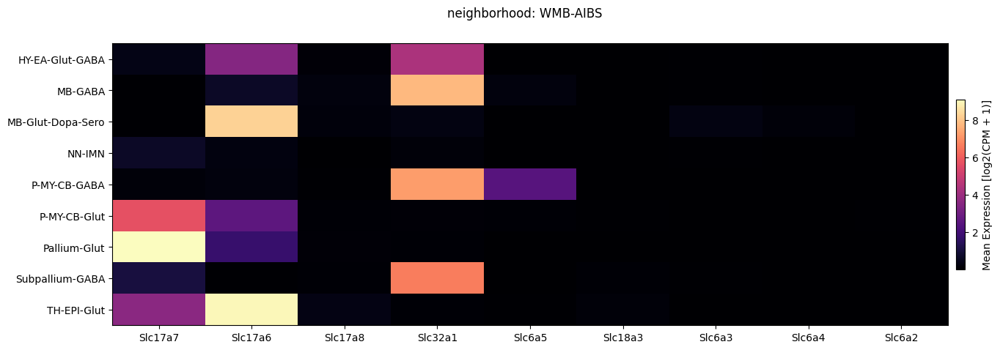

In [11]:
fig, ax = plot_heatmap(
    df=aibs_cell_extended,
    gnames=gene_names,
    value='neighborhood',
    fig_width=15,
    fig_height=5,
    sort=True
)
fig.suptitle('neighborhood: WMB-AIBS')
plt.show()

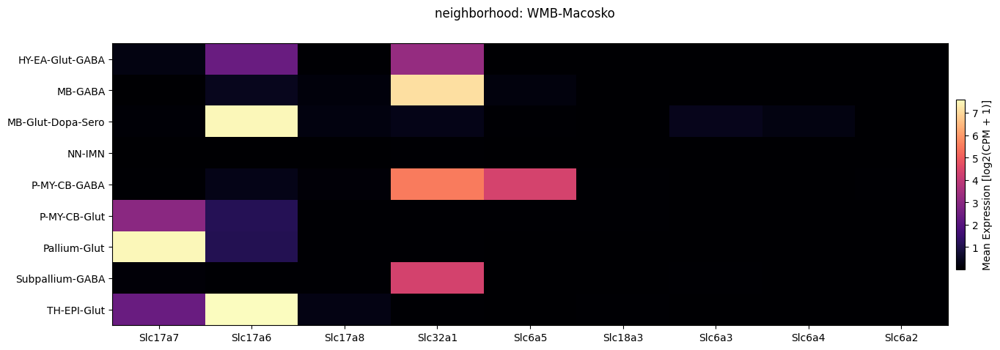

In [12]:
fig, ax = plot_heatmap(
    df=macosko_cell_extended,
    gnames=gene_names,
    value='neighborhood',
    fig_width=15,
    fig_height=5,
    sort=True
)
fig.suptitle('neighborhood: WMB-Macosko')
plt.show()

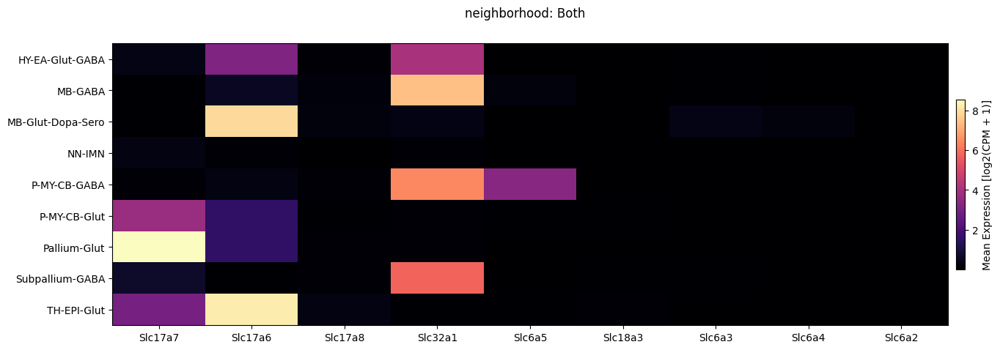

In [13]:
full_cell_extended = pd.concat([aibs_cell_extended, macosko_cell_extended])
fig, ax = plot_heatmap(
    df=full_cell_extended,
    gnames=gene_names,
    value='neighborhood',
    fig_width=15,
    fig_height=5,
    sort=True
)
fig.suptitle('neighborhood: Both')
plt.show()

Next we show the selected genes by neurotransmitter for both datasets.

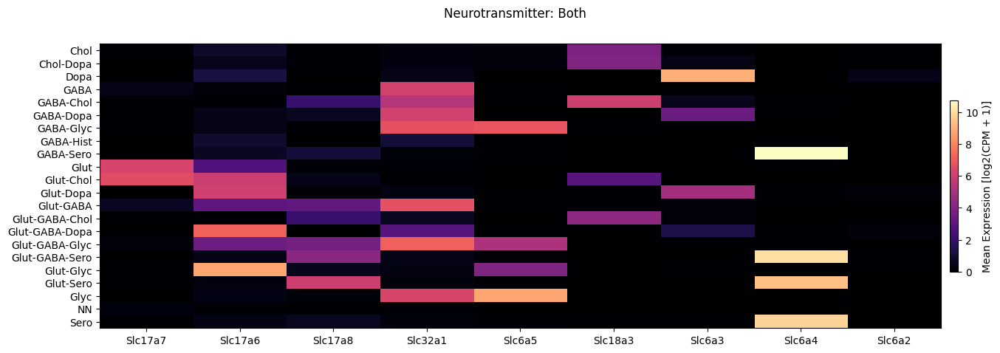

In [14]:
fig, ax = plot_heatmap(
    df=full_cell_extended,
    gnames=gene_names,
    value='neurotransmitter',
    fig_width=15,
    fig_height=5,
    sort=True
)
fig.suptitle('Neurotransmitter: Both')
plt.show()

Finally, we break down the expression by anatomical region symbol.

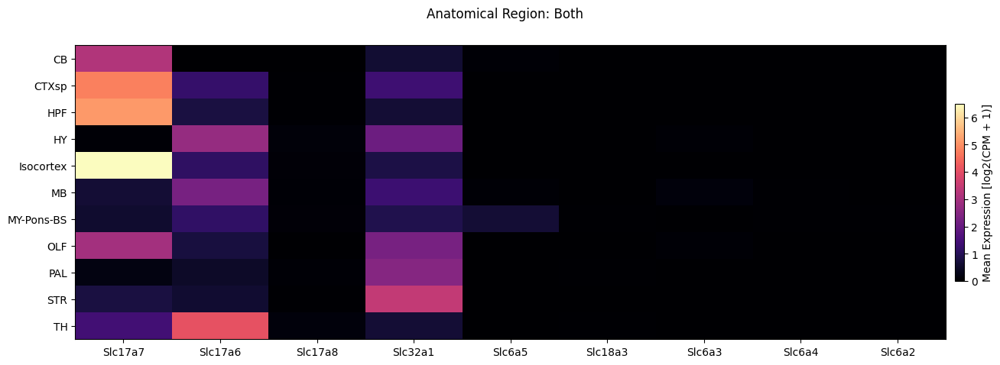

In [15]:
fig, ax = plot_heatmap(
    df=full_cell_extended,
    gnames=gene_names,
    value='anatomical_division_label',
    fig_width=15,
    fig_height=5,
    sort=True
)
fig.suptitle('Anatomical Region: Both')
plt.show()

#### Individual neighborhood gene expression

Next, we'll plot the same expression vs anatomical_region, but now we'll do so for only one of the neighborhoods, Pallium-Glut. Note that we expect the plot to be fairly dark as we are only showing the Pallium-Glut data and not all the canonical neurotransmitters will show expression.

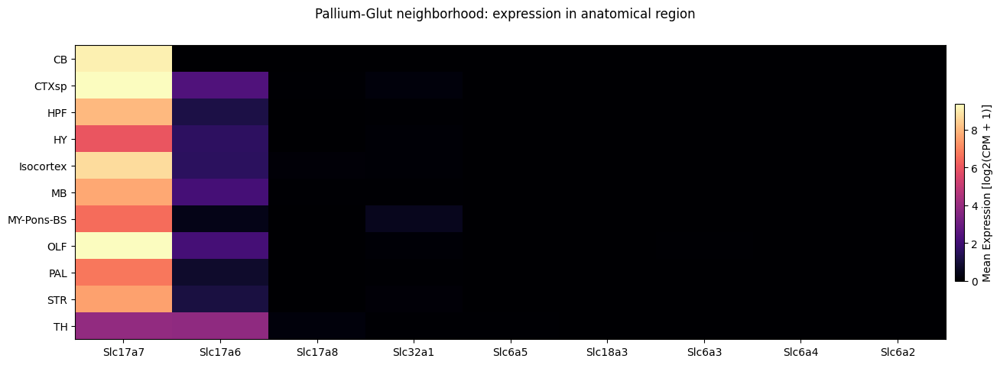

In [16]:
fig, ax = plot_heatmap(
    df=full_cell_extended[full_cell_extended['neighborhood'] == 'Pallium-Glut'],
    gnames=gene_names,
    value='anatomical_division_label',
    fig_width=15,
    fig_height=5,
    sort=True
)
fig.suptitle('Pallium-Glut neighborhood: expression in anatomical region')
plt.show()

We can also directly use our cell metadata table trimmed to the selected neighborhood in the `get_gene_data` function to retrieve a expression for a subset of cells only. If the data is already download, this may process the data more quickly given the smaller number of cells.

In [17]:
# Uncomment below to for an example of how to extract gene expression for a subset of cells only
example_gene_selection = ['Elovl6']
"""
aibs_sub_cells_gene_data = get_gene_data(
    abc_atlas_cache=abc_cache,
    all_cells=aibs_cell_extended[aibs_cell_extended['neighborhood'] == 'Pallium-Glut'],
    all_genes=aibs_gene,
    selected_genes=example_gene_selection
)"""

"""
macosko_sub_cells_gene_data = get_gene_data(
    abc_atlas_cache=abc_cache,
    all_cells=macosko_cell_extended[macosko_cell_extended['neighborhood'] == 'Pallium-Glut'],
    all_genes=macosko_gene,
    selected_genes=example_gene_selection
)
"""

"\nmacosko_sub_cells_gene_data = get_gene_data(\n    abc_atlas_cache=abc_cache,\n    all_cells=macosko_cell_extended[macosko_cell_extended['neighborhood'] == 'Pallium-Glut'],\n    all_genes=macosko_gene,\n    selected_genes=example_gene_selection\n)\n"

## Expression in the UMAP

Finally, we load the UMAP coordinates for our cells and plot the expression in the UMAP for each of our selected genes.

We could also load one of the neighborhood UMAPs that we showed in the [previous notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/consensus_mouse_clustering_analysis_and_annotation.html).

In [18]:
cell_2d_embedding_coordinates = value_sets = abc_cache.get_metadata_dataframe(
    directory='Consensus-WMB-integrated-taxonomy',
    file_name='cell_2d_embedding_coordinates'
).set_index('cell_label')
cell_2d_embedding_coordinates.head()

cell_2d_embedding_coordinates.csv: 100%|██████████| 490M/490M [00:15<00:00, 31.0MMB/s]    


,x,y
cell_label,,
GCGAGAAGTTAAGGGC-410_B05,16.037980,3.101109
AATGGCTCAGCTCCTT-411_B06,15.951514,3.144049
AACACACGTTGCTTGA-410_B05,15.900673,3.124507
CACAGATAGAGGCGGA-410_A05,16.062553,3.185574
GATCGTATCGAATCCA-411_B06,15.971468,3.124298


Join the coordinates into the cell metadata.

In [19]:
consensus_extended = full_cell_extended.join(
    cell_2d_embedding_coordinates
).sample(frac=1)
consensus_extended.head()

,cell_barcode,barcoded_cell_sample_label,library_label,dataset_label,feature_matrix_label,cluster_alias,class,cluster,neighborhood,neurotransmitter,...,Slc17a7,Slc6a5,Slc17a6,Slc6a2,Slc17a8,Slc6a4,Slc6a3,Slc18a3,x,y
cell_label,,,,,,,,,,,,,,,,,,,,,
pBICCNsMMrENTiM017d210119A2_GACGTTATCGATTGGT,GACGTTATCGATTGGT,NaN,pBICCNsMMrENTiM017d210119A2,Consensus-WMB-Macosko-10X,Macosko-10X-HPF,1696,001 IT-ET Glut,0197 L2-IT-PIR-ENTl_Glut 2,Pallium-Glut,Glut,...,7.861371,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,6.520203,-4.227495
CATGCCTAGTATCGAA-044_D01,CATGCCTAGTATCGAA,044_D01,L8TX_180829_01_E09,WMB-10Xv2,WMB-10Xv2-TH,10834,018 MH-LH Glut,2937 MH_Tac2_Glut 2,TH-EPI-Glut,Glut,...,7.909847,0.0,8.492808,0.0,0.0,0.0,0.0,0.0,-0.706705,19.370281
TGCTCCATCGAGTGAG-463_A05,TGCTCCATCGAGTGAG,463_A05,L8TX_201210_01_G03,WMB-10Xv3,WMB-10Xv3-TH,5463,012 HY GABA,1979 ZI_Pax6:Pou6f2:Meis2_Gaba 4,HY-EA-Glut-GABA,GABA,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.569090,4.921452
GGAGCAAAGGGCAGGA-323_A02,GGAGCAAAGGGCAGGA,323_A02,L8TX_200813_01_D10,WMB-10Xv3,WMB-10Xv3-CTXsp,13235,039 OPC-Oligo,6603 OPC_NN 3,NN-IMN,NN,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,-8.545147,-14.040805
pBICCNsMMrVISiF022d210719A2_ACGTAGTCAGCACGAA,ACGTAGTCAGCACGAA,NaN,pBICCNsMMrVISiF022d210719A2,Consensus-WMB-Macosko-10X,Macosko-10X-Isocortex,16618,001 IT-ET Glut,0055 L4/5-IT-CTX_Glut 7,Pallium-Glut,Glut,...,8.098426,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,11.389247,-4.361753


We use the same UMAP plotting convenience function as previously used in the [Consensus WMB clustering and annotation tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/consensus_mouse_clustering_analysis_and_annotation.html).

In [20]:
def plot_umap(
    xx: np.ndarray,
    yy: np.ndarray,
    cc: np.ndarray = None,
    val: np.ndarray = None,
    fig_width: float = 8,
    fig_height: float = 8,
    cmap: Optional[plt.Colormap] = None,
    labels: np.ndarray = None,
    term_orders: np.ndarray = None,
    colorbar: bool = False,
    sizes: np.ndarray = None,
    fig: plt.Figure = None,
    ax: plt.Axes = None,
 ) -> Tuple[plt.Figure, plt.Axes]:
    """
    Plot a scatter plot of the UMAP coordinates.

    Parameters
    ----------
    xx : array-like
        x-coordinates of the points to plot.
    yy : array-like
        y-coordinates of the points to plot.
    cc : array-like, optional
        colors of the points to plot. If None, the points will be colored by the values in `val`.
    val : array-like, optional
        values of the points to plot. If None, the points will be colored by the values in `cc`.
    fig_width : float, optional
        width of the figure in inches. Default is 8.
    fig_height : float, optional
        height of the figure in inches. Default is 8.
    cmap : str, optional
        colormap to use for coloring the points. If None, the points will be colored by the values in `cc`.
    labels : array-like, optional
        labels for the points to plot. If None, no labels will be added to the plot.
    term_orders : array-like, optional
        order of the labels for the legend. If None, the labels will be ordered by their appearance in `labels`.
    colorbar : bool, optional
        whether to add a colorbar to the plot. Default is False.
    sizes : array-like, optional
        sizes of the points to plot. If None, all points will have the same size.
    fig : matplotlib.figure.Figure, optional
        figure to plot on. If None, a new figure will be created with 1 subplot.
    ax : matplotlib.axes.Axes, optional
        axes to plot on. If None, a new figure will be created with 1 subplot.
    """

    if sizes is None:
        sizes = 1
    if ax is None or fig is None:
        fig, ax = plt.subplots()
        fig.set_size_inches(fig_width, fig_height)

    if cmap is not None:
        scatt = ax.scatter(xx, yy, c=val, s=0.5, marker='.', cmap=cmap, alpha=sizes)
    elif cc is not None:
        scatt = ax.scatter(xx, yy, c=cc, s=0.5, marker='.', alpha=sizes)

    if labels is not None:
        from matplotlib.patches import Rectangle
        unique_label_colors = (labels + ',' + cc).unique()
        unique_labels = np.array([label_color.split(',')[0] for label_color in unique_label_colors])
        unique_colors = np.array([label_color.split(',')[1] for label_color in unique_label_colors])

        if term_orders is not None:
            unique_order = term_orders.unique()
            term_order = np.argsort(unique_order)
            unique_labels = unique_labels[term_order]
            unique_colors = unique_colors[term_order]
            
        rects = []
        for color in unique_colors:
            rects.append(Rectangle((0, 0), 1, 1, fc=color))

        legend = ax.legend(rects, unique_labels, loc=0)
        # ax.add_artist(legend)
    
    ax.set_xticks([])
    ax.set_yticks([])

    if colorbar:
        fig.colorbar(scatt, ax=ax)
    
    return fig, ax

Below we plot the first 2 genes in our set next to the UMAP colored by anatomical region.

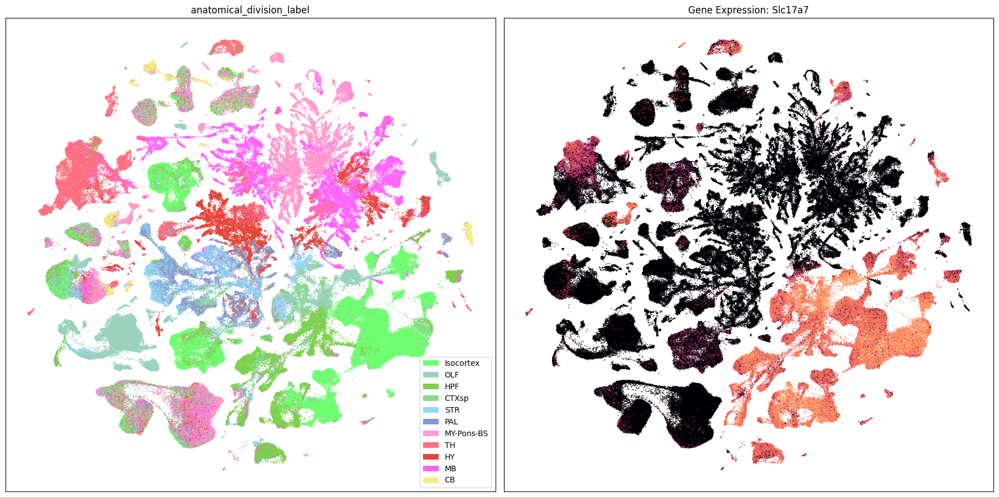

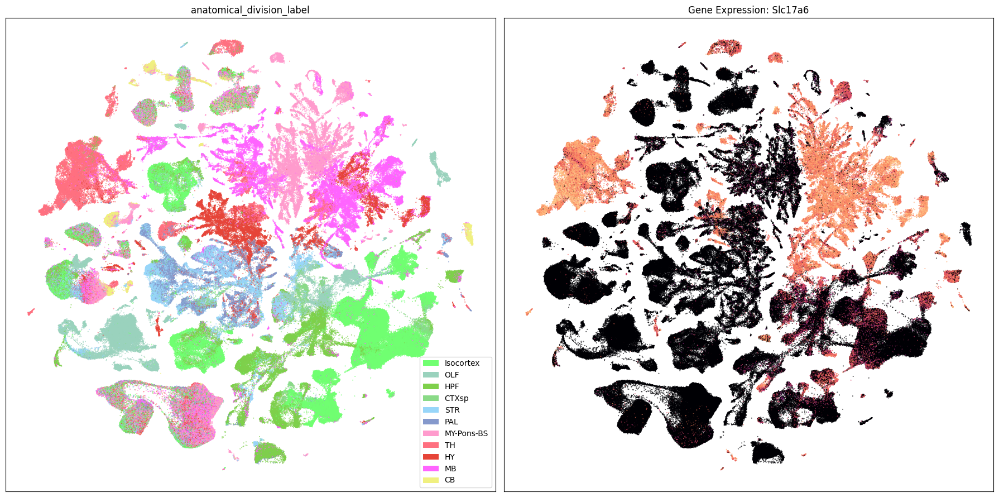

In [21]:
term_to_plot = 'anatomical_division_label'
sub_cell_extended = consensus_extended[::10]

# Plot UMAPs for the first two genes in gene_names
for gene_name in gene_names[:2]:
    fig, ax = plt.subplots(1, 2)
    fig.set_size_inches(18, 9)
    ax = ax.flatten()
    plot_umap(
        sub_cell_extended['x'],
        sub_cell_extended['y'],
        cc=sub_cell_extended[term_to_plot + '_color'],
        labels=sub_cell_extended[term_to_plot],
        term_orders=sub_cell_extended[term_to_plot + '_order'],
        fig=fig,
        ax=ax[0],
    )
    ax[0].set_title(term_to_plot)
    plot_umap(
        sub_cell_extended['x'],
        sub_cell_extended['y'],
        val=sub_cell_extended[gene_name],
        cmap=plt.cm.magma,
        fig=fig,
        ax=ax[1],
        colorbar=False,
    )
    ax[1].set_title(f'Gene Expression: {gene_name}')
    plt.tight_layout()
    plt.show()

# Neighborhood UMAPs

Finally, let's plot each the anatomical regions and one of the genes, in this case we choose Slc17a6, for each of the 9 neighborhood UMAPs. Again, `term_to_plot` can be modified for to show e.g class, donor_sex, or any of the other data features with color and order information. `gene_to_plot` can be modified here to use any gene that was previously merged into our metadata tables.

Pallium-Glut_cell_2d_embedding_coordinates.csv: 100%|██████████| 138M/138M [00:03<00:00, 36.0MMB/s]   


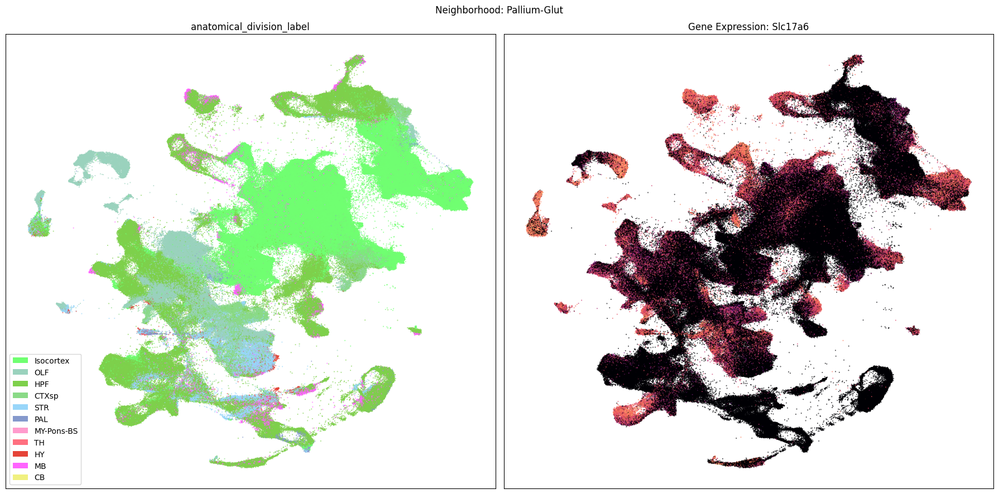

Subpallium-GABA_cell_2d_embedding_coordinates.csv: 100%|██████████| 53.7M/53.7M [00:01<00:00, 33.2MMB/s]  


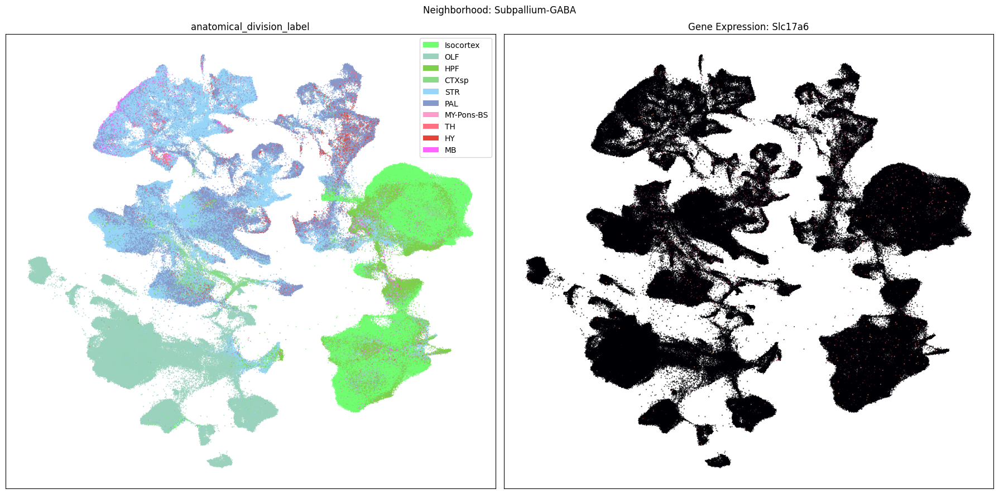

HY-EA-Glut-GABA_cell_2d_embedding_coordinates.csv: 100%|██████████| 16.5M/16.5M [00:00<00:00, 22.7MMB/s]


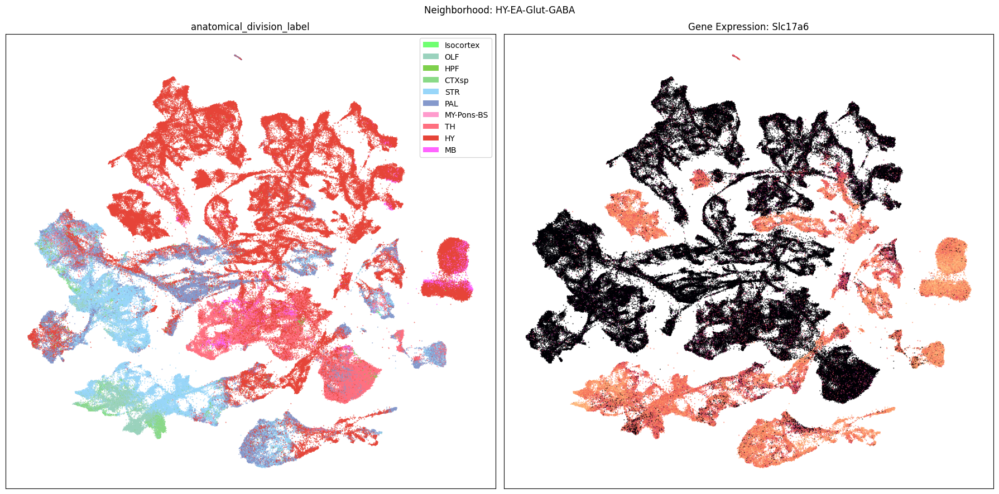

MB-Glut-Dopa-Sero_cell_2d_embedding_coordinates.csv: 100%|██████████| 15.2M/15.2M [00:00<00:00, 24.3MMB/s]


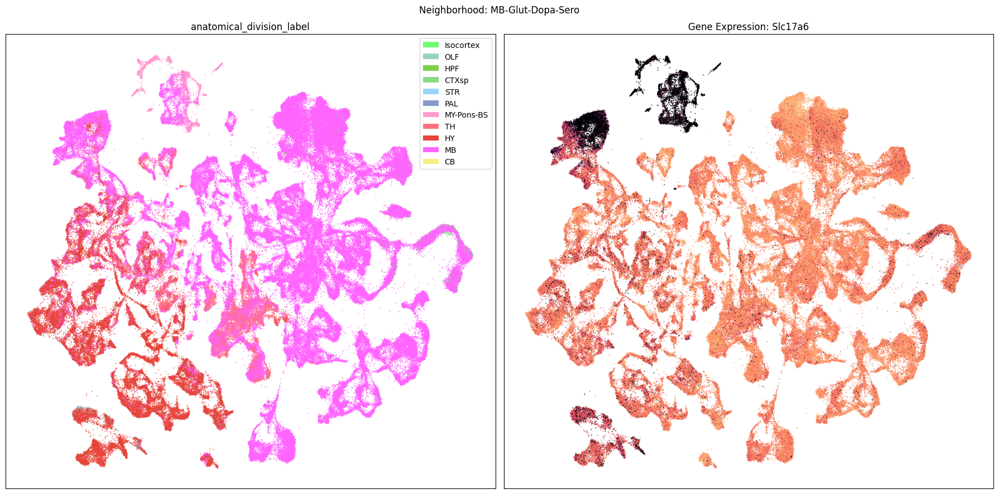

TH-EPI-Glut_cell_2d_embedding_coordinates.csv: 100%|██████████| 15.8M/15.8M [00:00<00:00, 25.6MMB/s]


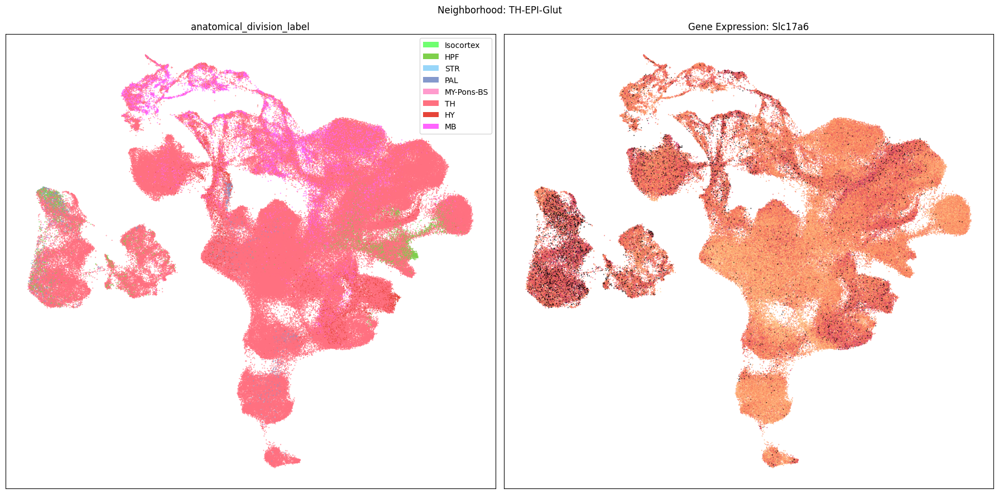

MB-GABA_cell_2d_embedding_coordinates.csv: 100%|██████████| 8.94M/8.94M [00:00<00:00, 19.0MMB/s]


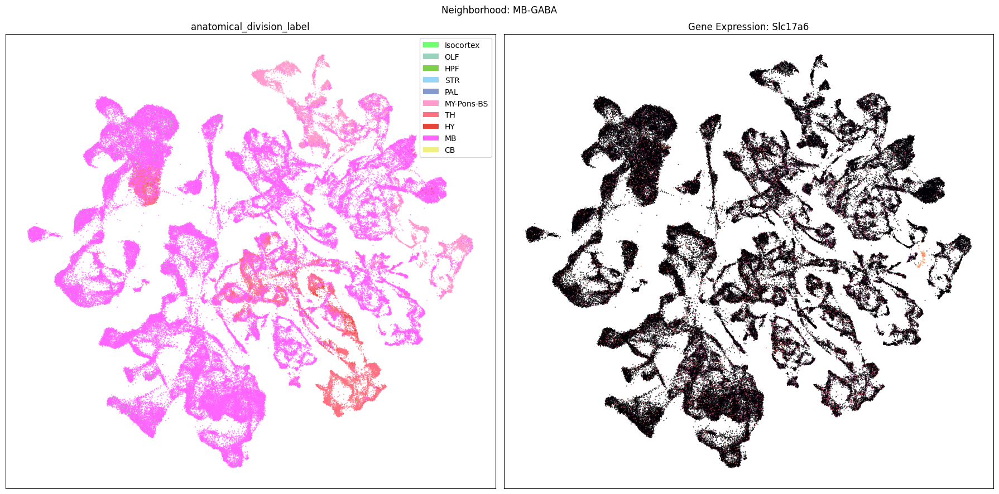

P-MY-CB-Glut_cell_2d_embedding_coordinates.csv: 100%|██████████| 55.5M/55.5M [00:01<00:00, 29.7MMB/s]  


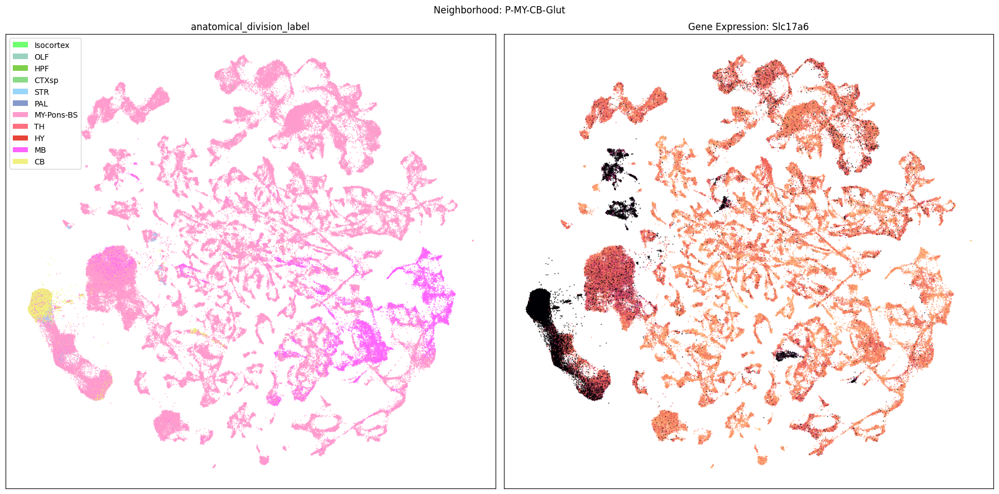

P-MY-CB-GABA_cell_2d_embedding_coordinates.csv: 100%|██████████| 11.1M/11.1M [00:00<00:00, 23.5MMB/s]


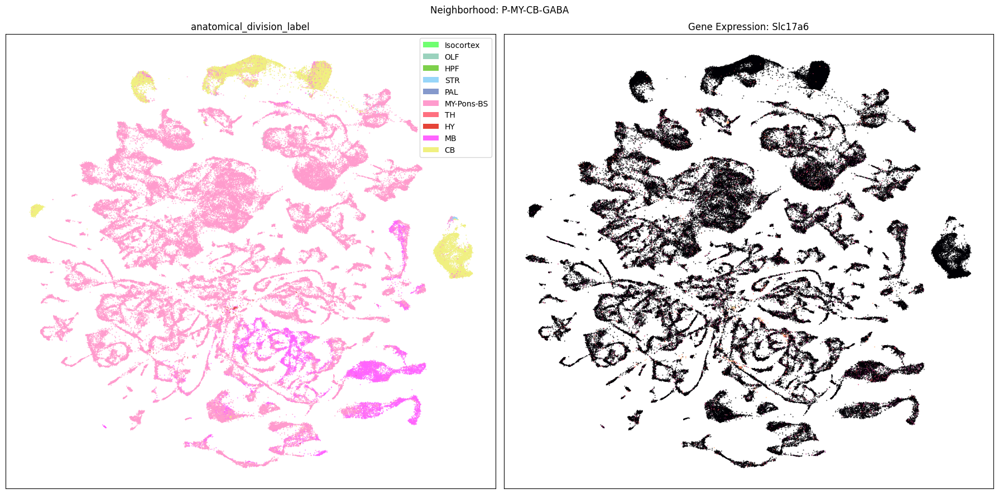

NN-IMN_cell_2d_embedding_coordinates.csv: 100%|██████████| 184M/184M [00:05<00:00, 35.1MMB/s]   


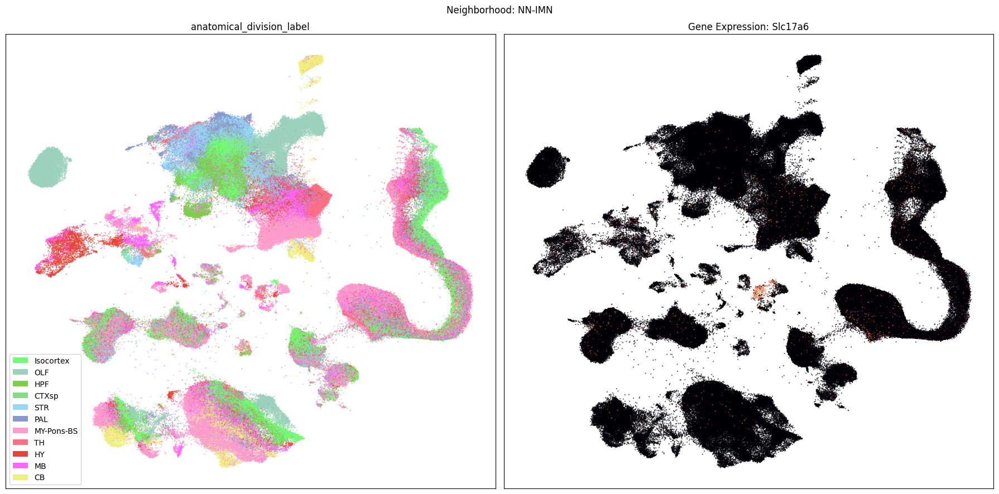

In [22]:
term_to_plot = 'anatomical_division_label' # Can change to other metadata feature (e.g. taxonomy level)
sub_cell_extended = consensus_extended[::10]
gene_to_plot = gene_names[1]

for idx, neighborhood in enumerate(cluster_annotation_term[
        cluster_annotation_term['cluster_annotation_term_set_name'] == 'neighborhood'
        ].sort_values('term_order')['name']):   
    # Loop through all neighborhoods and plot subclass UMAPs ordered by term_order.
    fig, ax = plt.subplots(1, 2)
    fig.set_size_inches(18, 9)
    ax = ax.flatten()
    neighborhood_cells = consensus_extended.join(
        abc_cache.get_metadata_dataframe(
            'Consensus-WMB-integrated-taxonomy',
            f'{neighborhood}_cell_2d_embedding_coordinates'
            ).set_index('cell_label'),
        how='inner',
        rsuffix=f'_{neighborhood}'
    )
    plot_umap(
        neighborhood_cells[f'x_{neighborhood}'],
        neighborhood_cells[f'y_{neighborhood}'],
        cc=neighborhood_cells[term_to_plot + '_color'],
        labels=neighborhood_cells[term_to_plot],
        term_orders=neighborhood_cells[term_to_plot + '_order'],
        fig=fig,
        ax=ax[0],
    )
    ax[0].set_title(term_to_plot)
    plot_umap(
        neighborhood_cells[f'x_{neighborhood}'],
        neighborhood_cells[f'y_{neighborhood}'],
        val=neighborhood_cells[gene_to_plot],
        cmap=plt.cm.magma,
        fig=fig,
        ax=ax[1],
        colorbar=False,
    )
    ax[1].set_title(f'Gene Expression: {gene_to_plot}')
    fig.suptitle(f'Neighborhood: {neighborhood}')
    plt.tight_layout()
    plt.show()

Check out the previous exploration of the taxonomy and clustering annotations [here](https://alleninstitute.github.io/abc_atlas_access/notebooks/consensus_mouse_clustering_analysis_and_annotation.html). The notebooks for the AIBS, Whole Mouse Brain dataset can be found [here](https://alleninstitute.github.io/abc_atlas_access/descriptions/notebook_subtitle1.html).